# Star Wars Characters as Word Clouds

** About: ** I this notebook I crawl the scipts of the Star Wars Episodes I-VI movies, extract and process content spoken by several Star Wars characters and visualize each character as a word cloud.

Filter the display of any warnings in this notebook

In [1]:
import warnings
warnings.filterwarnings('ignore')

Some imports; For crawling the HMTLs containing the scripts of the movies I will be using [beautifulsoup](https://pypi.python.org/pypi/beautifulsoup4) and the [requests](http://docs.python-requests.org/en/master/) library.

In [2]:
from collections import defaultdict
import re
import string

import bs4
from bs4.element import NavigableString
import requests

As a datasource I will be using the [Internet Movie Script Database (IMSDb)](http://www.imsdb.com/), which contains all scripts for each Star Wars Episode.

In [3]:
episodes = {'Episode I': 'http://www.imsdb.com/scripts/Star-Wars-The-Phantom-Menace.html',
            'Episode II': 'http://www.imsdb.com/scripts/Star-Wars-Attack-of-the-Clones.html',
            'Episode III': 'http://www.imsdb.com/scripts/Star-Wars-Revenge-of-the-Sith.html',
            'Episode IV': 'http://www.imsdb.com/scripts/Star-Wars-A-New-Hope.html',
            'Episode V': 'http://www.imsdb.com/scripts/Star-Wars-The-Empire-Strikes-Back.html',
            'Episode VI': 'http://www.imsdb.com/scripts/Star-Wars-Return-of-the-Jedi.html'}

### Episode IV - A New Hope

I will be crawling the episodes in cronological order of appearance, hence I start with Episode IV.
Crawling the script simply consists of a GET request to the goal URL. The content of the response if then converted to a soup object

In [4]:
res = requests.get(episodes.get('Episode IV'))
soup = bs4.BeautifulSoup(res.content)

A quick look into the rendered HTML of the Episode IV script, shows that all spoken text is preceded by the character's name embedded in an HTML `b` tag. Moreover, the `b` tag is indented more than in the case of a location announcement `b` tag (a quick inspection tells me that the indention is in fact 37 spaces. Hence the crawling approach I take here is to iterate over all `b` tags in the soup, check if the `b` tag is in fact indented at least 37 spaces. If this is the case, then the `next sibling` of the `b` tag will give me the character's spoken text. Finally, I iterate over each line of the dialogue (until I find an empty line) and filter out those lines that start with a '(', which indicates a description and is not part of the dialogue.<br>

This is the code I apply:

In [5]:
# get all bold tags from the HTML
bolds = soup.findAll('b')

In [6]:
# define a default dictionary to which all spoken words of each character will be appended to
characters_4 = defaultdict(str)

In [7]:
# iterate over each bold tag
for b in bolds:
    # make sure the the indention is larger than a certain value, else continue
    if len(b.text) - len(b.text.lstrip()) < 37:
        continue
    # iterate of each line of the dialogue
    for t in b.nextSibling.split('\n'):
        # break if we hit a blank line
        if not t:
            break
        stripped = t.strip()
        # if line does not start with a '(' character, append the text to the default dict
        if not stripped.startswith('('):
            characters_4[b.text.strip()] += ' ' + stripped

The result of the crawl is a dictionary of the format `character name`: `spoken text`. This shows the list of the top 10 characters in Episode IV, sorted by the amount of spoken words:

In [8]:
sorted(characters_4, key=lambda k: len(characters_4[k]), reverse=True)[:10]

[u'LUKE',
 u'HAN',
 u'THREEPIO',
 u'BEN',
 u'LEIA',
 u'BIGGS',
 u'VADER',
 u'TARKIN',
 u'OWEN',
 u'RED LEADER']

And here is an example entry in the dictionary (for **Darth Vader**):

In [9]:
characters_4.get('VADER')

u" Where are those transmissions you intercepted? What have you done with those plans? If this is a consular ship... were is the Ambassador? Commander, tear this ship apart until you've found those plans and bring me the Ambassador. I want her alive! Don't play games with me, Your Highness. You weren't on any mercy mission this time. You passed directly through a restricted system. Several transmissions were beamed to this ship by Rebel spies. I want to know what happened to the plans they sent you. You're a part of the Rebel Alliance... and a traitor. Take her away! I have traced the Rebel spies to her. Now she is my only link to find their secret base! Leave that to me. Send a distress signal and then inform the senate that all aboard were killed! She must have hidden the plans in the escape pod. Send a detachment down to retrieve them. See to it personally, Commander. There'll be no one to stop us this time. The plans you refer to will soon be back in our hands. Don't be too proud o

characters_4 = merge_entries(characters_4, [('BEN', 'BEN\'S VOICE'),
                                            ('HAN', 'HAN\'S VOICE'),
                                            ('LUKE', 'LUKE\'S VOICE')])

### Episode V - The Empire Strikes Back

For Episode V crawling is essentially identical, with the only difference that the identation of the `b` tag that discriminates between a location setting and a character dialogue is different because this time it is encoded in tabs and not spaces. Other than that, the dialogue extraction procedure is equivalent:

In [10]:
# get request
res = requests.get(episodes.get('Episode V'))
# create soup object
soup = bs4.BeautifulSoup(res.content)

In [11]:
# get all bold tags from the HTML
bolds = soup.findAll('b')

In [12]:
# define a dictionary to store all characters' dialogues from this episode
characters_5 = defaultdict(str)

In [13]:
# iterate over all bold tags
for b in bolds:
    # check if number of identation tabs equals 4
    if len(b.text) - len(b.text.lstrip()) != 4:
        continue
    # iterate over each line
    for t in b.nextSibling.split('\n'):
        # if line is blank, break
        if not t:
            break
        stripped = t.strip()
        # append to dictionary if line does not start with character '('
        if not stripped.startswith('('):
            characters_5[b.text.strip()] += ' ' + stripped

Top 10 characters sorted by amount of spoken text:

In [14]:
sorted(characters_5, key=lambda k: len(characters_5[k]), reverse=True)[:10]

[u'HAN',
 u'THREEPIO',
 u'LUKE',
 u'LEIA',
 u'VADER',
 u'LANDO',
 u'YODA',
 u'PIETT',
 u'CREATURE',
 u'RIEEKAN']

Merging text that belongs to a single character

characters_5 = merge_entries(characters_5, [('BEN', 'BEN\'S VOICE')])

### Episode VI - Return of the Jedi

Crawling of *Return of the Jedi* is a bit different than in the episodes before. Again character dialogues are announced in `b` tags and so are location settings; however now the major distinction between both is that location settings are preceeded by a digit.

In [15]:
# make get request and extract HTML content using bs4
res = requests.get(episodes.get('Episode VI'))
soup = bs4.BeautifulSoup(res.content)

In [16]:
# extract all b tags from HTML, skip the script heading
bolds = soup.findAll('b')
bolds = bolds[5:]

In [17]:
# instantiate default dict
characters_6 = defaultdict(str)

In [18]:
# iterated over b tags
for i, b in enumerate(bolds):
    # check if first character is a digit
    if b.text[0].isdigit():
        continue
    # make sure next sibling is a string
    if type(b.nextSibling) != NavigableString:
        continue
    # iterate over each line
    for t in b.nextSibling.split('\n'):
        # if line is empty, we're done
        if not t:
            break
        stripped = t.strip()
        # if line does not start with '(' char, append to dict
        if not stripped.startswith('('):
            c = b.text.strip().split('\t')[0]
            characters_6[c] += ' ' + stripped

In [19]:
sorted(characters_6, key=lambda k: len(characters_6[k]), reverse=True)

[u'THREEPIO',
 u'LUKE',
 u'HAN',
 u'EMPEROR',
 u'BEN',
 u'VADER',
 u'LANDO',
 u'LEIA',
 u'ACKBAR',
 u'YODA',
 u'MON MOTHMA',
 u'NINEDENINE',
 u'WEDGE',
 u'PIETT',
 u'COMMANDER',
 u'JERJERROD',
 u'GENERAL MADINE',
 u'BOUSHH',
 u'SHUTTLE CAPTAIN',
 u'HAN/PILOT',
 u'STORMTROOPER',
 u'BIB',
 u'GUARD',
 u'LURE',
 u'CONTROLLER',
 u'ANAKIN',
 u'REBEL PILOT',
 u'ACKBAR ',
 u'SCOUT #1',
 u'OFFICER',
 u'CONTROL ROOM COMMANDER',
 u'RED THREE',
 u'OOLA',
 u'JABBA',
 u'RED LEADER',
 u'SCOUT',
 u'BUNKER COMMANDER',
 u'GREEN LEADER',
 u'GRAY LEADER',
 u'PILOT #2',
 u'STRANGE VOICE',
 u'VOICE',
 u'PILOT',
 u'NAVIGATOR',
 u'SCOUT #2',
 u'OPERATOR',
 u'SECOND COMMANDER',
 u'Y-WING PILOT',
 u'RED TWO',
 u'WALKER PILOT #1',
 u'Genres',
 u'Writers']

### Episode I - The Phantom Menace

For Episode I crawling and text extraction again differs from our previous approaches. By inspecting the HTML we first find that the script's content is written in a `pre` tag. Hence the first step is to extract that content.  

In [20]:
# make get request and extract response content
res = requests.get(episodes.get('Episode I'))
soup = bs4.BeautifulSoup(res.content)

In [21]:
# bod = soup.find('body')
# find the `pre` tag in the HTML
raw = soup.find('pre')

In [22]:
# instantiate default dict
characters_1 = defaultdict(str)

The dialogue extraction consists in iterating over the children of the about extracted element. Each line of those children is retrieved by splitting at double new-line characters (`\n\n`). Furthermore, a dialogue is indicated by the character's name followd by a colon - hence if splitting the line by a colon does not reveal more than a single entry, the current line is not part of a dialogue. And finally, I make sure the current line is a dialogue by checking that the first entry of the split object is upper-case (indicating the character's name), and I remove text embedded in brackets.

In [23]:
# iterate of all children of the pre HTML tag
for child in raw.children:
    # make sure tupe is a string
    if type(child) != NavigableString:
        continue
    # split by two subsequent newline characters
    l = child.split('\n\n')
    # iterate of each line
    for s in l:
        # split by colon character
        content_list = s.split(':')
        # if length of split is one, continue with next line
        if len(content_list) == 1:
            continue
        # if first entry of split is in upper case
        if content_list[0].isupper():
            # remove text in brackets
            content = re.sub(r'\([^)]*\)', '', ' '.join(content_list[1:])).strip()
            # append to dict
            characters_1[content_list[0].strip()] += ' ' + content

In [24]:
sorted(characters_1, key=lambda k: len(characters_1[k]), reverse=True)

[u'QUI-GON',
 u'ANAKIN',
 u'OBI-WAN',
 u'CAPT. PANAKA',
 u'JAR JAR',
 u'PADME',
 u'PALPATINE',
 u'NUTE',
 u'WATTO',
 u'YODA',
 u'SHMI',
 u'AMIDALA',
 u'DARTH SIDIOUS',
 u'BOSS NASS',
 u'RUNE',
 u'B',
 u'THREEPIO',
 u'BIBBLE',
 u'RIC OLIE',
 u'KITSTER',
 u'DARTH MAUL',
 u'A',
 u'MACE WINDU',
 u'SEBULBA',
 u'JIRA',
 u'(O.S) A',
 u'BAIL ORGANA',
 u'CAPTAIN',
 u'BRAVO TWO',
 u'JABBA',
 u'TEY HOW',
 u'PANAKA',
 u'LOTT DOD',
 u'AKS MOE',
 u'BATTLE DROID CAPTAIN',
 u'GUARD DROID',
 u'TC-14',
 u'OOM-9',
 u'GUARD',
 u'PK-4',
 u'VALORUM',
 u'EG-9',
 u'SABE',
 u'FIGHTER PILOT',
 u'WALD',
 u'CAPT. TARPALS',
 u'GUNGAN LOOKOUT',
 u'TITLE CARD',
 u'GENERAL CEEL',
 u'ANAKN',
 u'VENDOR',
 u'P-59',
 u'MAS AMEDDA',
 u'ASSEMBLY',
 u'OWO-1',
 u'TC14',
 u'BATTLE DROID 3B3']

characters_1 = merge_entries(characters_1, [('ANAKIN', 'ANAKN'),
                                            ('AMIDALA', 'PADME')])

### Episode II - Attack of the Clones

Dialoge text extraction in *Attack of the Clone* is similar to Episode V. I again iterate over `b` tags and make sure that the indentation length equals 4. On top of that I check whether the indentation of each line within the `b` tag is exactly 3 - this ensures that the text in this line is actual spoken text (and not other script instructions).

In [25]:
# make get request and extract HTML content
res = requests.get(episodes.get('Episode II'))
soup = bs4.BeautifulSoup(res.content)

In [26]:
# get all b tags
bolds = soup.findAll('b')

In [27]:
# init default dict for this episode
characters_2 = defaultdict(str)

In [28]:
# itereate of all b tags
for b in bolds:
    # make sure identation equals 4
    if len(b.text) - len(b.text.lstrip()) != 4:
        continue
    # split each line
    for t in b.nextSibling.split('\n'):
        # amke sure identation equals 3
        if len(t) - len(t.lstrip()) != 3:
            continue
        stripped = t.strip()
        # append to dict
        characters_2[b.text.strip()] += ' ' + stripped

In [29]:
sorted(characters_2, key=lambda k: len(characters_2[k]), reverse=True)

[u'ANAKIN',
 u'PADM\xc9',
 u'OBI-WAN',
 u'PADME',
 u'PALPATINE',
 u'MACE WINDU',
 u'YODA',
 u'LAMA SU',
 u'JAR JAR',
 u'JOCASTA NU',
 u'C-3PO',
 u'COUNT DOOKU',
 u'DOOKU',
 u'DEXTER JETTSTER',
 u'QUEEN JAMILLIA',
 u'TAUN WE',
 u'WATTO',
 u'CLIEGG',
 u'SIO BIBBLE',
 u'MAS AMEDDA',
 u'BAIL ORGANA',
 u'SOLA',
 u'CAPTAIN TYPHO',
 u'JOBAL',
 u'PK-4',
 u'RUWEE',
 u'SENATOR ASK AAK',
 u'OWEN',
 u'JANGO',
 u'JANGO FETT',
 u'POGGLE',
 u'OBI-WAN (V.O.)',
 u'SUN RIT',
 u'SHMI',
 u'NUTE GUNRAY',
 u'ORN FREE TAA',
 u'MACE',
 u'KI-ADI-MUNDI',
 u'AMIDALA',
 u'WINDU',
 u'ZAM WESSEL',
 u'AMBASSADOR DARSANA',
 u'HERMIONE BAGWA',
 u'DORME',
 u'DARTH SIDIOUS',
 u'CLIEGG (O.S.)',
 u'CHILDREN',
 u'BOBA FETT',
 u'ELAN',
 u'JOVAL',
 u'MACE-WINDU',
 u'CLONE CAPTAIN',
 u'JEDI CHILD JACK',
 u'JEDI CHILD MAY',
 u'BERU (V.O.)',
 u'CORD\xc9',
 u'DAR WAC',
 u'PLO KOON',
 u'RYOO & POOJA',
 u'ZAM',
 u'PAMDE',
 u'ELAN SLEAZEBAGGANO',
 u'OBI-WAM',
 u'SERVER',
 u'DROID CAPTAIN',
 u'BOBA',
 u'FOOD SERVER',
 u'HERMIONE',
 

characters_2 = merge_entries(characters_2, [('AMIDALA', 'PADME'),
                                            ('AMIDALA', u'PADM\xc9'),
                                            ('AMIDALA', 'PAMDE'),
                                            ('THREEPIO', 'C-3PO'),
                                            ('OBI-WAN', 'OBI-WAM'),
                                            ('OBI-WAN', 'OBI-WAN (V.O.)')])

## Episode III - Revenge of the Sith

Dialogue text extraction in Episode III is fairly easy: We simply interate over the HMTL body's lines; if a line contains a colon and it's first entry is upper-case, the current line is dialogue text and the character is encoded by the string before the colon.

In [30]:
# make get request, extract HTML content
res = requests.get(episodes.get('Episode III'))
soup = bs4.BeautifulSoup(res.content)

In [31]:
# get HMTL's body element
bod = soup.find('body')

In [32]:
# init default dict for this episode
characters_3 = defaultdict(str)

In [33]:
# iterate over each line in body elemnent
for b in bod.text.split('\n\n'):
    # split line by colon
    content_list = b.split(':')
    # if length of split is only 1, continue to next line
    if len(content_list) == 1:
        continue
    # if first entry of split is upper-case, append dialogue text
    if content_list[0].isupper():
            # remove text in brackets
            content = re.sub(r'\([^)]*\)', '', ' '.join(content_list[1:])).strip()
            characters_3[content_list[0].strip()] += ' ' + content

In [34]:
sorted(characters_3, key=lambda k: len(characters_3[k]), reverse=True)

[u'ANAKIN',
 u'OBI-WAN',
 u'PALPATINE',
 u'PADME',
 u'YODA',
 u'BAIL ORGANA',
 u'GENERAL GRIEVOUS',
 u'C-3PO',
 u'MACE',
 u'MON MOTHMA',
 u'CLONE COMMANDER CODY',
 u'COUNT DOOKU',
 u'DARTH SIDIOUS',
 u'NUTE GUNRAY',
 u'MEDICAL DROID',
 u'QUI -GON',
 u'QUI-GON',
 u'PILOT',
 u'CLONE SERGEANT',
 u'DARTH VADER',
 u'MACE WINDU',
 u'MAS AMEDDA',
 u'GUARD',
 u'ODD BALL',
 u'CAPTAIN ANTILLES',
 u'GIDDEAN DANU',
 u'BANA BREEMU',
 u'CLONE COMMANDER GREE',
 u'CAPTAIN TYPHO',
 u'FANG ZAR',
 u'CREATURE',
 u'JAR JAR',
 u'CLONE PILOT 2',
 u'SUPER BATTLE DROID G21',
 u'CLONE CAPTAIN',
 u'WRANGLER',
 u'SUPER BATTLE DROID 1',
 u'BODYGUARD',
 u'YOUNGLINGS',
 u'BODYGUARD I',
 u'CLONE COMMANDER THIRE',
 u'AAYLA',
 u'CLONE TROOPER',
 u'PLO KOON',
 u'CAPTAIN',
 u'DABTH SIDIOUS',
 u'BATTLE DROID',
 u'CLONE COMMANDER BACARA',
 u'SUPER BATTLE DROID',
 u'SUPER BATTLE DROID R77',
 u'RUNE HAAKO',
 u'SUPER BATTLE DROID 2',
 u'DROID 1',
 u'STAR WARS EPISODE 3',
 u'CLONE PILOT',
 u'TERR TANEEL',
 u'AT-ST CLONE SERGEA

characters_3 = merge_entries(characters_3, [('AMIDALA', 'PADME'),
                                            ('THREEPIO', 'C-3PO'),
                                            ('QUI-GON', 'QUI -GON'),
                                            ('ANAKIN', 'ANAKINN')])

Now that we have all dialogue text extracted from all episodes, we will combine all dialogue texts from each episode into a single dictionary.

In [35]:
# append all dictionaries into a single list
episodes_list = [characters_1, characters_2, characters_3, characters_4, characters_5, characters_6]

In [36]:
# iterate over each dict and combine into a single one
combined_episodes = defaultdict(str)
for ep in episodes_list:
    for k, v in ep.iteritems():
        combined_episodes[k] += ' ' + v

In [37]:
sorted(combined_episodes, key=lambda k: len(combined_episodes[k]), reverse=True)

[u'ANAKIN',
 u'OBI-WAN',
 u'LUKE',
 u'HAN',
 u'THREEPIO',
 u'PALPATINE',
 u'PADME',
 u'YODA',
 u'QUI-GON',
 u'LEIA',
 u'PADM\xc9',
 u'BEN',
 u'VADER',
 u'JAR JAR',
 u'LANDO',
 u'CAPT. PANAKA',
 u'WATTO',
 u'C-3PO',
 u'BAIL ORGANA',
 u'NUTE',
 u'EMPEROR',
 u'BIGGS',
 u'MACE WINDU',
 u'SHMI',
 u'TARKIN',
 u'AMIDALA',
 u'COUNT DOOKU',
 u'LAMA SU',
 u'OWEN',
 u'DARTH SIDIOUS',
 u'JOCASTA NU',
 u'DOOKU',
 u'GENERAL GRIEVOUS',
 u'BOSS NASS',
 u'MACE',
 u'PIETT',
 u'RED LEADER',
 u'JABBA',
 u'MON MOTHMA',
 u'ACKBAR',
 u'CREATURE',
 u'DODONNA',
 u'WEDGE',
 u'DEXTER JETTSTER',
 u'QUEEN JAMILLIA',
 u'TAUN WE',
 u'MAS AMEDDA',
 u'RUNE',
 u'RIEEKAN',
 u'OFFICER',
 u'CLIEGG',
 u'B',
 u'BIBBLE',
 u'TROOPER',
 u'RIC OLIE',
 u'KITSTER',
 u'DARTH MAUL',
 u'CAPTAIN TYPHO',
 u'SIO BIBBLE',
 u'MOTTI',
 u'GREEDO',
 u'VEERS',
 u'PK-4',
 u'TAGGE',
 u'A',
 u'CAPTAIN',
 u'NUTE GUNRAY',
 u'GOLD LEADER',
 u'COMMANDER',
 u'NEEDA',
 u'SOLA',
 u'SEBULBA',
 u'CLONE COMMANDER CODY',
 u'JIRA',
 u'JOBAL',
 u'NINEDENINE

A visual inspection of the all dictionary keys shows that there are separate entries for spoken text that actually belongs to the same character, e.g. `'BEN'` and `'BEN'S VOICE'`. Hence, in the next stemp I define a simple function that merges those identified entries into the same key. I intenionally decided to keep `OBI-WAN` (as denoted in episodes I-III) and `BEN` (episodes IV-VI) separated.

In [38]:
def merge_entries(dic, tuples):
    for keep, drop in tuples:
        dic[keep] += ' ' + dic[drop]
        del dic[drop]
    return dic

In [39]:
combined_episodes = merge_entries(combined_episodes, [#('OBI-WAN', 'BEN'),
                                                      ('ANAKIN', 'ANAKN'),
                                                      ('ANAKIN', 'ANAKINN'),
                                                      ('BEN', 'BEN\'S VOICE'),
                                                      ('COUNT DOOKU', 'DOOKU'),
                                                      ('CAPT. PANAKA', 'PANAKA'),
                                                      ('DARTH VADER', 'VADER'),
                                                      ('DARTH SIDIOUS', 'DABTH SIDIOUS'),
                                                      ('HAN', 'HAN\'S VOICE'),
                                                      ('LUKE', 'LUKE\'S VOICE'),
                                                      ('MACE WINDU', 'MACE-WINDU'),
                                                      ('MACE WINDU', 'WINDU'),
                                                      ('OBI-WAN', 'OBI-WAM'),
                                                      ('OBI-WAN', 'OBI-WAN (V.O.)'),
                                                      ('PADME', 'AMIDALA'),
                                                      ('PADME', u'PADM\xc9'),
                                                      ('PADME', 'PAMDE'),
                                                      ('QUI-GON', 'QUI -GON'),
                                                      ('THREEPIO', 'C-3PO'),
    ])

These are the top 20 characters over the all six episodes sorted by the amount of spoken text

In [40]:
sorted(combined_episodes, key=lambda k: len(combined_episodes[k]), reverse=True)[:20]

[u'ANAKIN',
 u'OBI-WAN',
 u'PADME',
 u'THREEPIO',
 u'LUKE',
 u'HAN',
 u'PALPATINE',
 u'YODA',
 u'QUI-GON',
 u'LEIA',
 u'BEN',
 u'DARTH VADER',
 u'JAR JAR',
 u'LANDO',
 u'CAPT. PANAKA',
 u'COUNT DOOKU',
 u'WATTO',
 u'BAIL ORGANA',
 u'NUTE',
 u'EMPEROR']

For further text pre-processing and word cloud generation I chose only the following most popular (from my subjective point of view) characters:

In [41]:
chosen = [u'OBI-WAN', u'ANAKIN', u'PADME', u'THREEPIO', u'LUKE', u'HAN', u'PALPATINE', u'YODA', u'QUI-GON', u'LEIA',
          u'DARTH VADER', u'JAR JAR', u'LANDO', u'CAPT. PANAKA', u'COUNT DOOKU', 'EMPEROR', 'BEN']

In [42]:
characters = dict([(k, v) for k, v in combined_episodes.iteritems() if k in chosen])

### Stopwords

The next stip is to remove stopwords from the extracted text. For stopword removal I used three different sources: Two list of englisch stopwords I found by a quick Google search, and the list of stopwords provided by the NLTK library. All list most probably have a large overlap, but out of pure laziness I simply use the set of (unique) stopwords from all three lists.

In [43]:
# read first stopwords list from file
with open('stopwords-1.csv') as f:
   stop_words = [x.strip() for x in f.read().split(',')]

In [44]:
# read second stopwords list form file
with open('stopwords-2.csv') as f:
    extended_stopwords = [x.strip() for x in f.readlines()]
    extended_stopwords = [x for x in extended_stopwords if x]

In [45]:
# import nltk and stopwords corpus
import nltk
from nltk.corpus import stopwords
# nltk.download()

In [46]:
# combine stopwords from all sources
stop_words += stopwords.words('english')
stop_words += extended_stopwords
stop_words = set(stop_words)

### Text cleaning

The cleaning process consits of the following steps:

(1) Remove punctuation
(2) Re-add punctuation for selected characters (e.g. `r2 d2` should be treated as a single term `r2-d2`) 
(3) Remove special characters such as tabs and newlines
(4) Remove stopwords and split text into list of words

In [47]:
rm_punctuation_map = dict((ord(char), u' ') for char in string.punctuation)
repls = ('jar jar', 'jar-jar'), ('obi wan', 'obi-wan'), ('qui gon', 'qui-gon'), ('r2 d2', 'r2-d2'), \
    (u'padm\xe9', 'padme')
    
def string_cleaning(characters):
    cleaned = dict()
    for k, v in characters.iteritems():
        txt = v.translate(rm_punctuation_map).lower()
        txt = re.sub(r'\s+', ' ', txt)
        txt = reduce(lambda a, kv: a.replace(*kv), repls, txt)
        cleaned[k] = [word for word in txt.split(' ') if word not in stop_words]
    return cleaned

In [48]:
cleaned = string_cleaning(characters)

### Wordclouds 

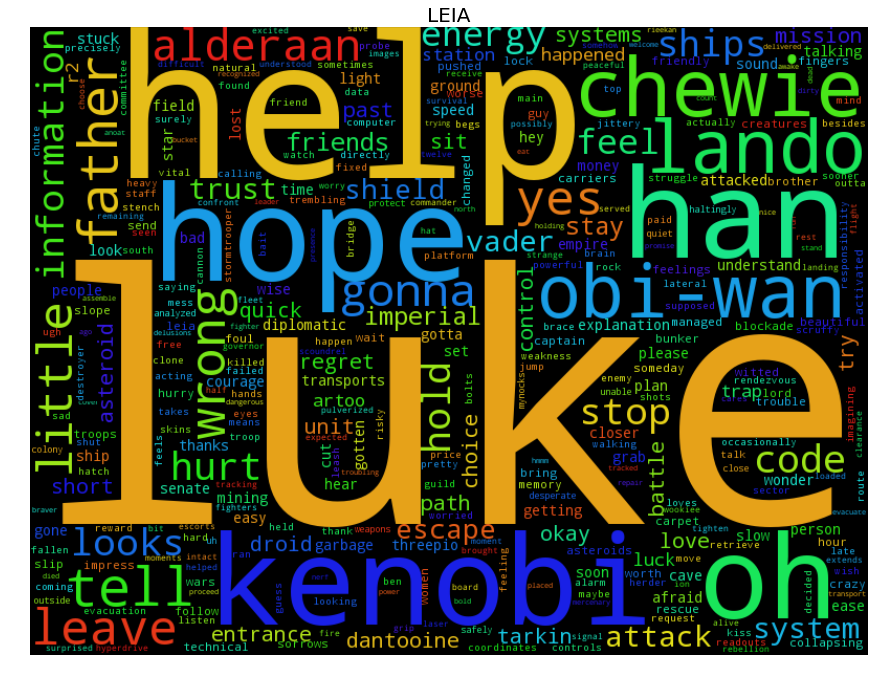

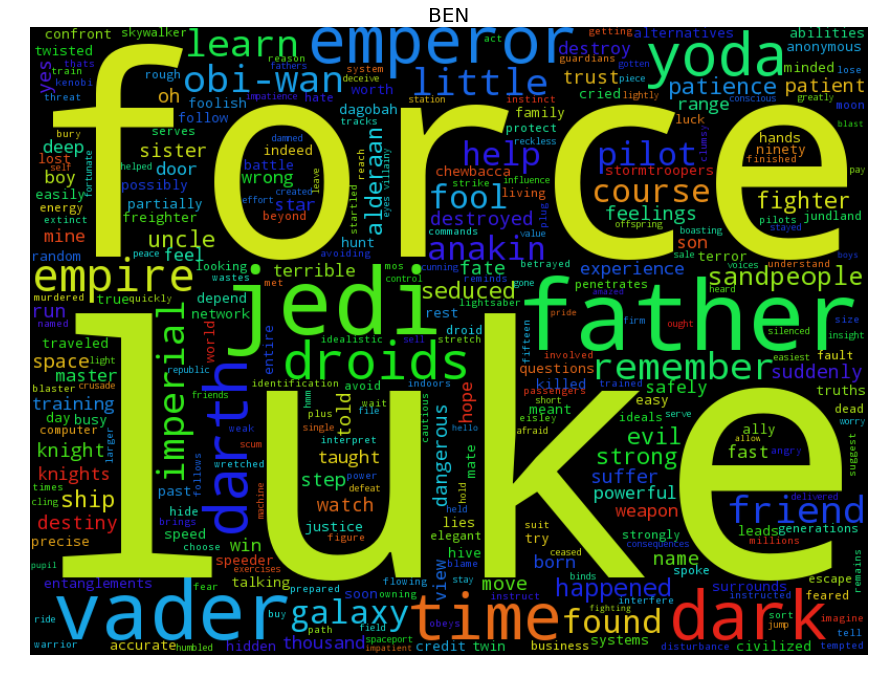

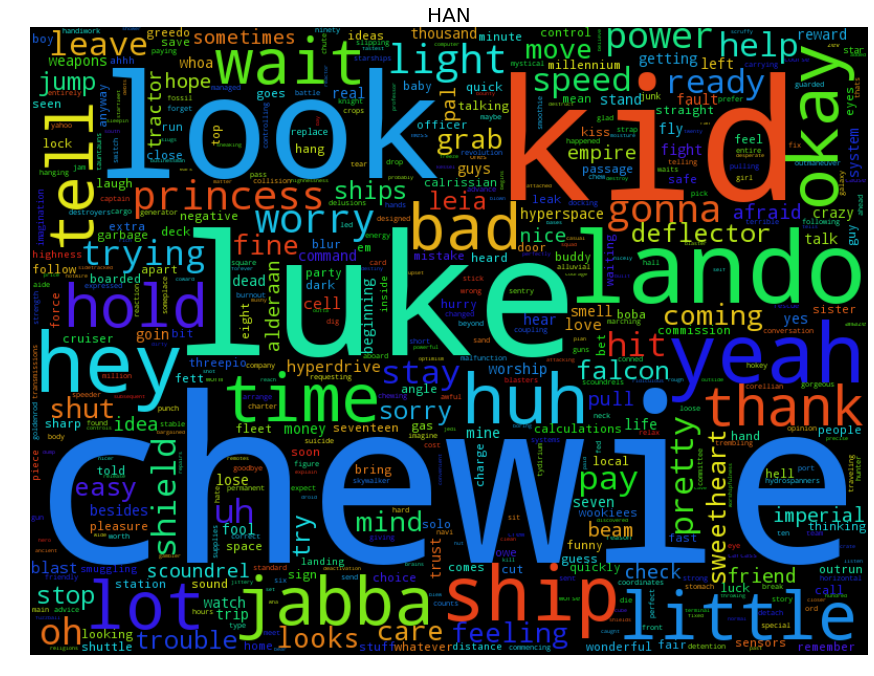

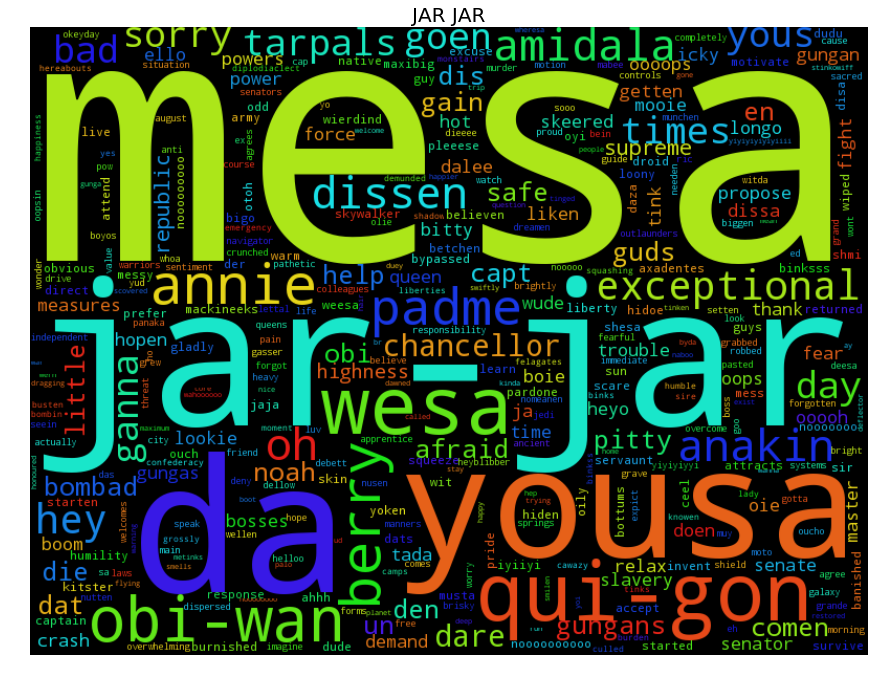

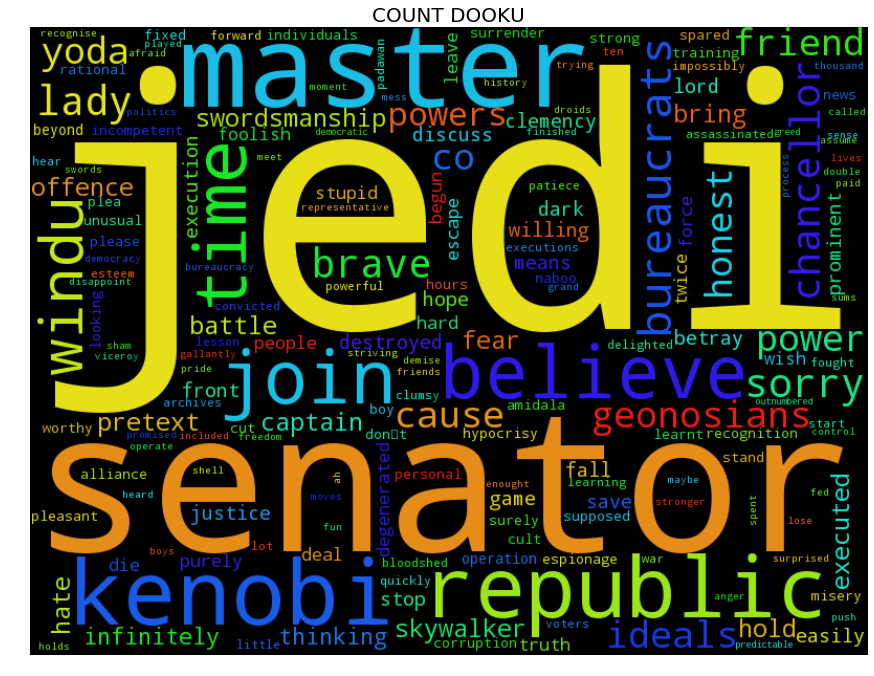

...

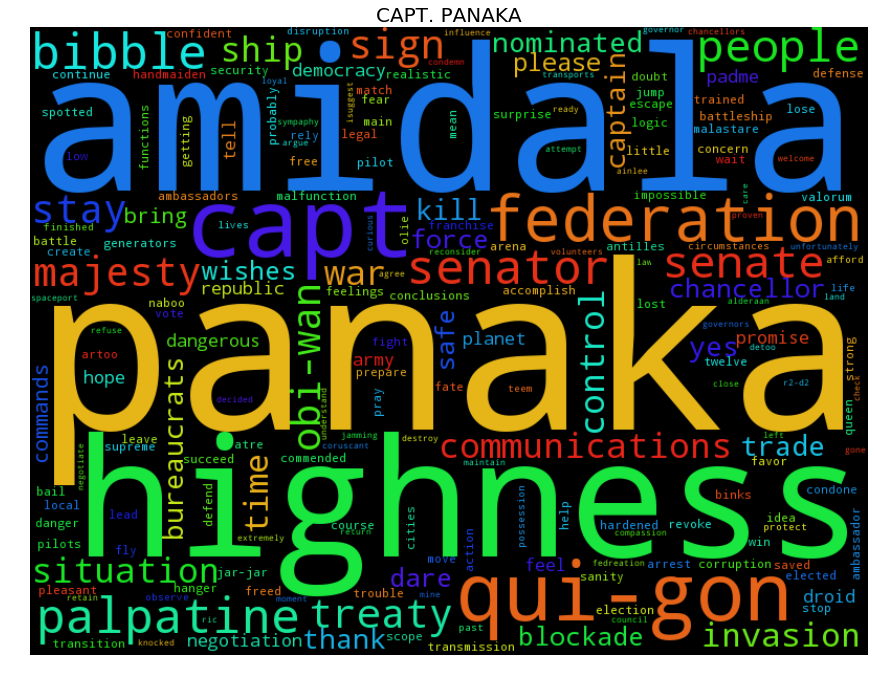

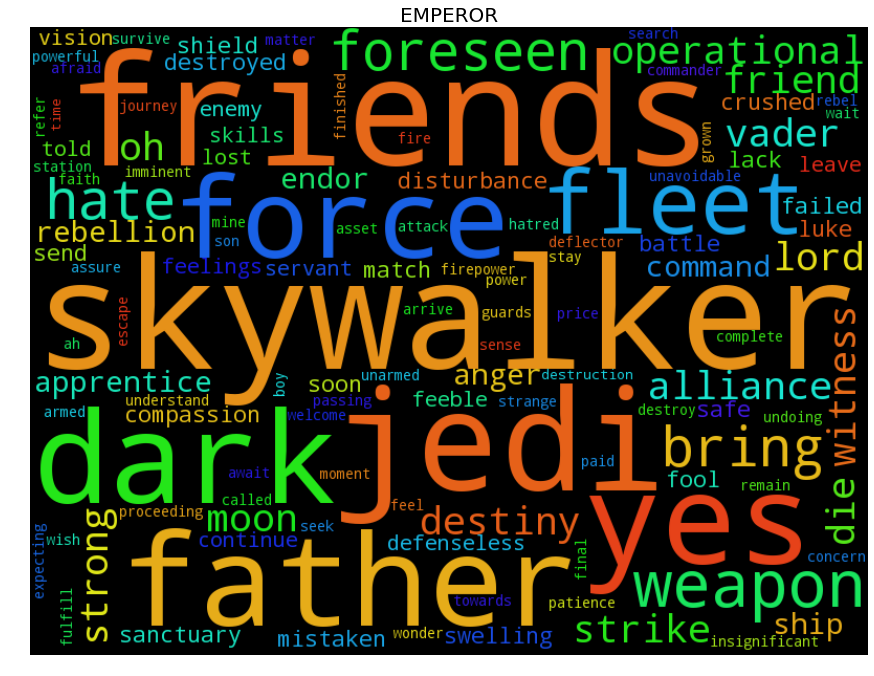

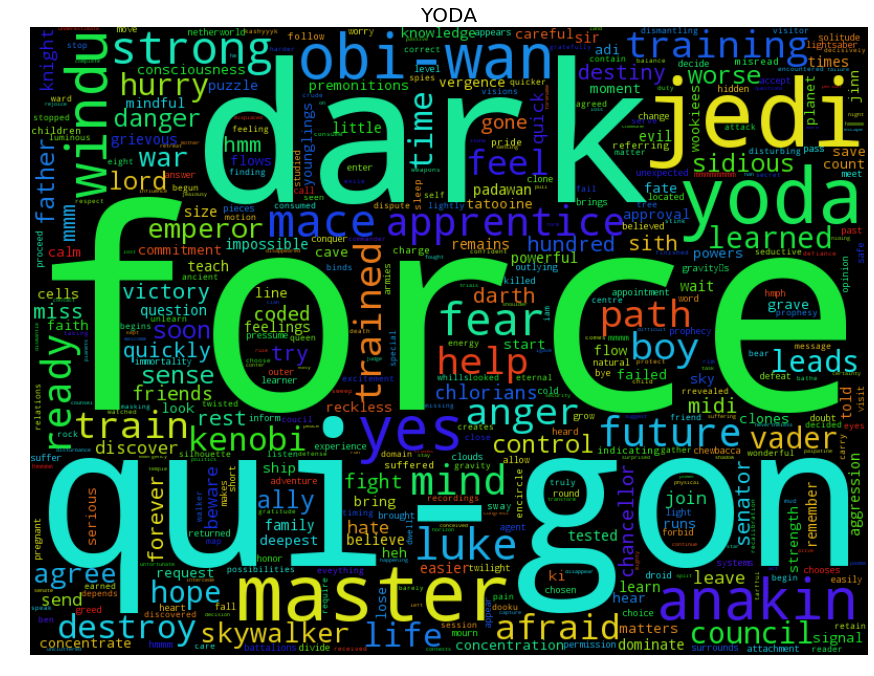

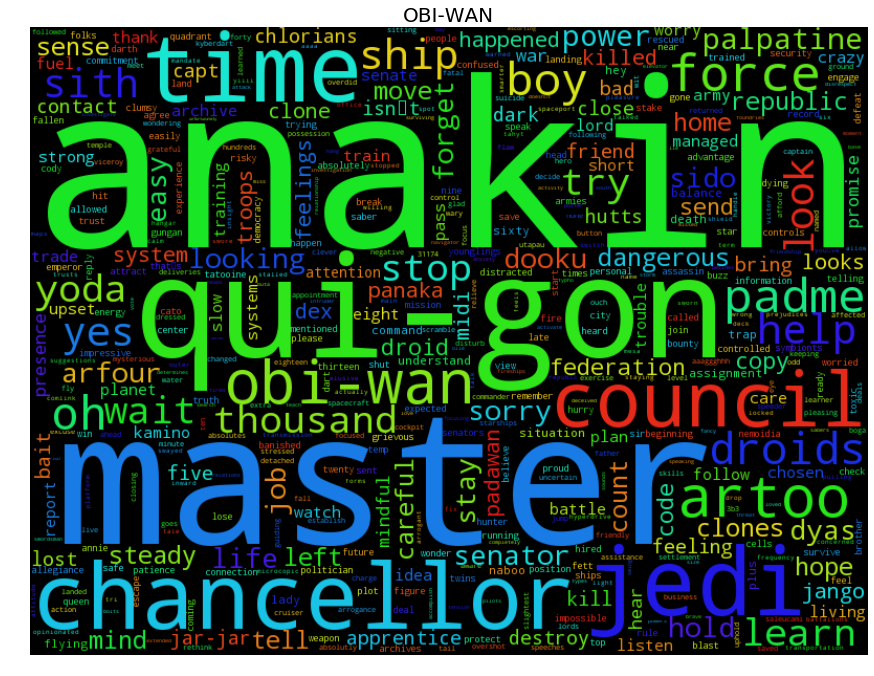

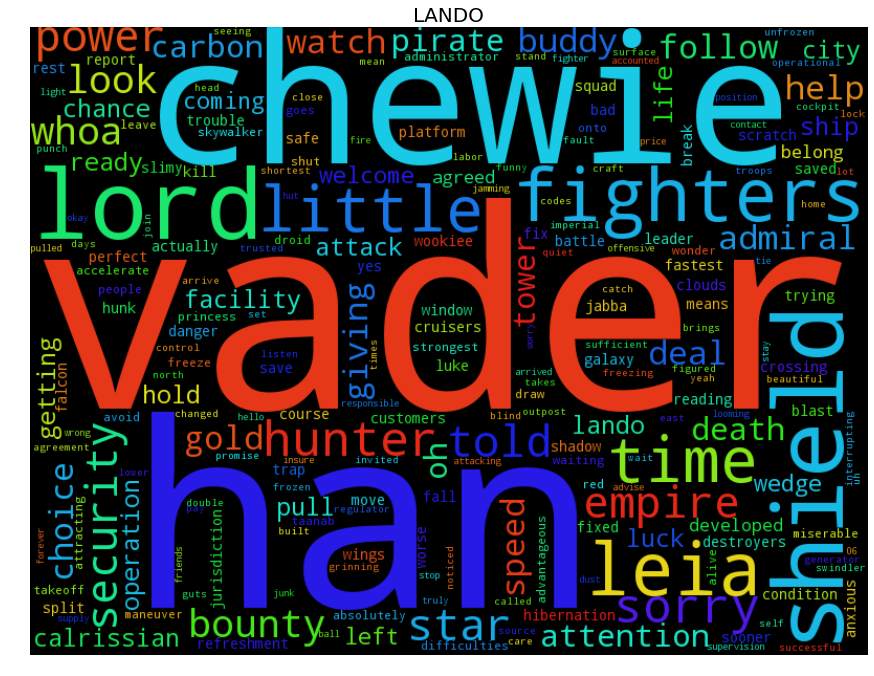

In [49]:
from collections import Counter
import pylab as pl
%matplotlib inline
from wordcloud import WordCloud

for k, v in cleaned.iteritems():
    text = ' '.join(v)
    
    frequencies = Counter(text.split(' ')) 
    wordcloud = WordCloud(relative_scaling=.5, width=800, height=600,
                          max_words=500).generate_from_frequencies(frequencies.items())
    pl.figure(figsize=(15, 15))
    pl.imshow(wordcloud, cmap=pl.cm.gray)
    pl.axis('off')
    pl.title(k, fontsize=20)
    pl.show()

In [50]:
from random import randint
def green(word=None, font_size=None, position=None,
              orientation=None, font_path=None, random_state=None):
    return 'hsl(120, 100%, {}%)'.format(randint(0, 50))

In [51]:
def red(word=None, font_size=None, position=None,
        orientation=None, font_path=None, random_state=None):
    return 'hsl(0, 50%, {}%)'.format(randint(0, 50))

In [52]:
import numpy as np
from skimage.io import imread
from skimage.transform import resize

In [53]:
mask_names = {'LUKE': 'luke.png', 'HAN': 'han.png', 'DARTH VADER': 'vader.png', 'PADME': 'padme.jpg',
              'OBI-WAN': 'obi_wan.jpg', 'YODA': 'yoda.png', 'EMPEROR': 'death_star.jpg', 'THREEPIO': 'threepio.png',
              'LANDO': 'cloud_city.jpg'}

In [54]:
bright = ['LUKE', 'HAN', 'PADME', 'OBI-WAN', 'YODA', 'THREEPIO']

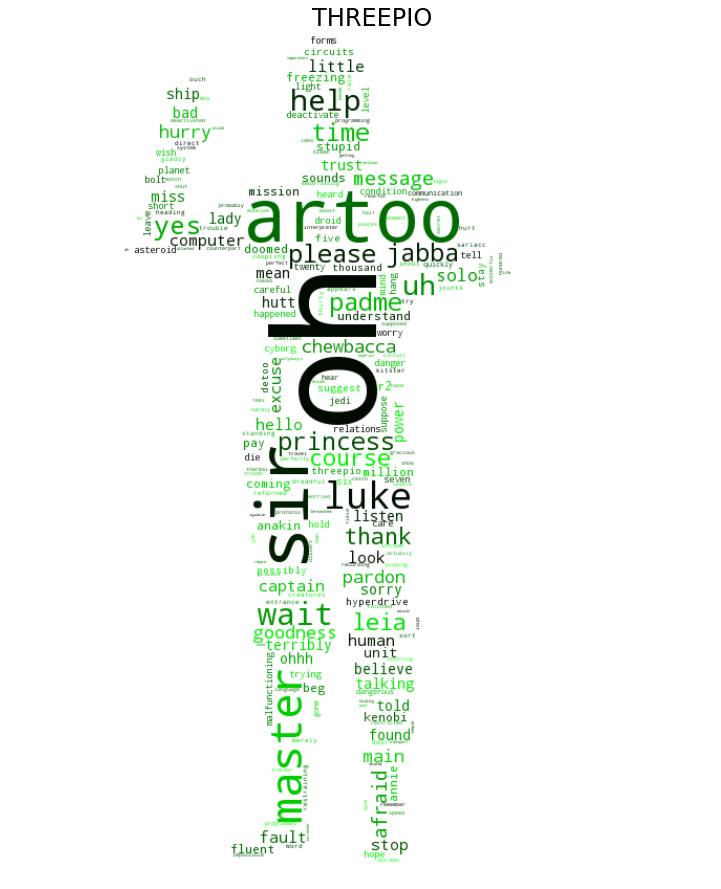

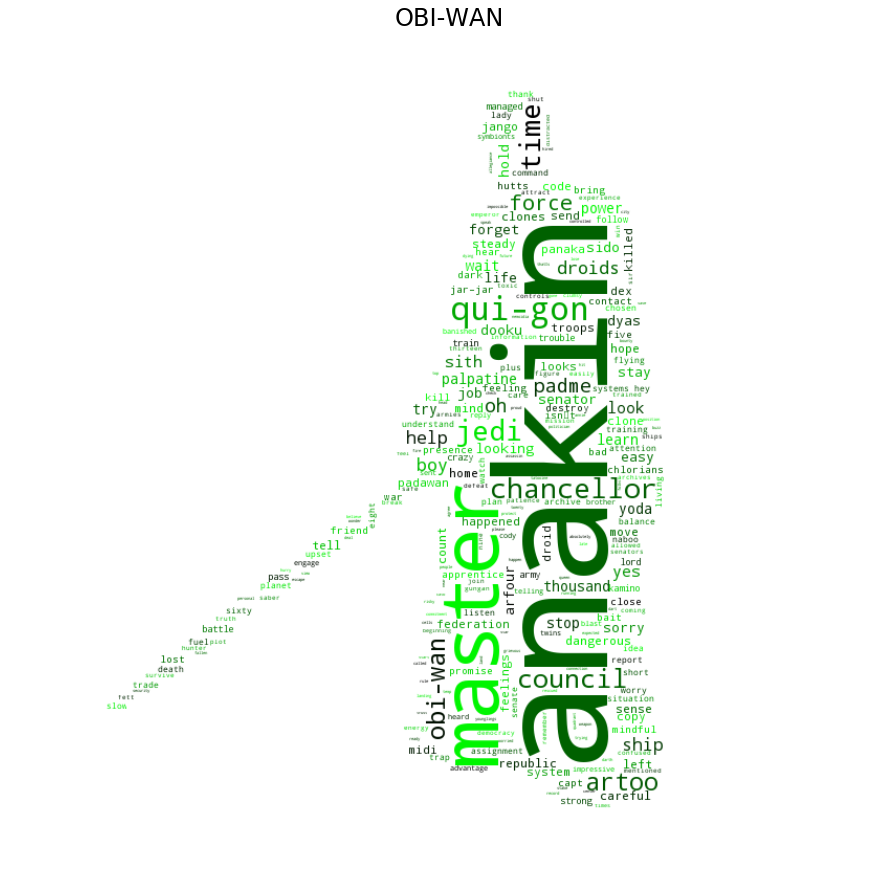

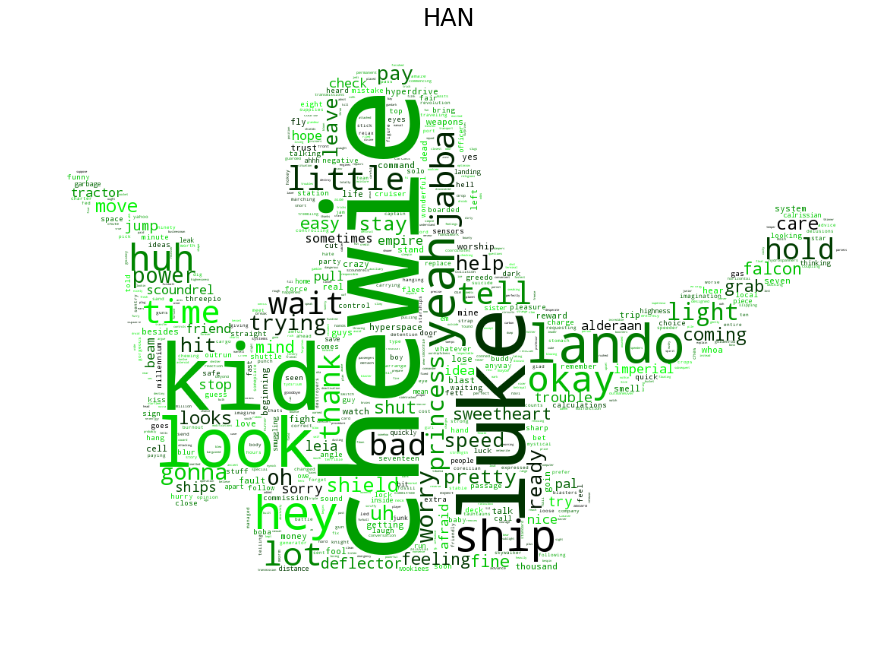

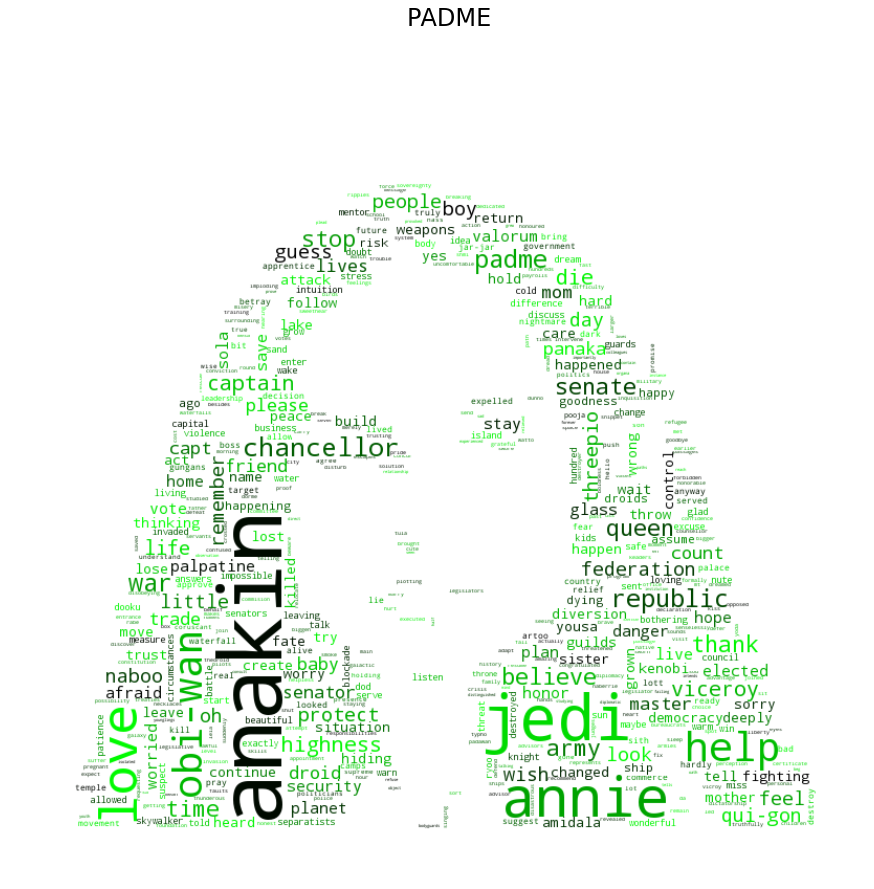

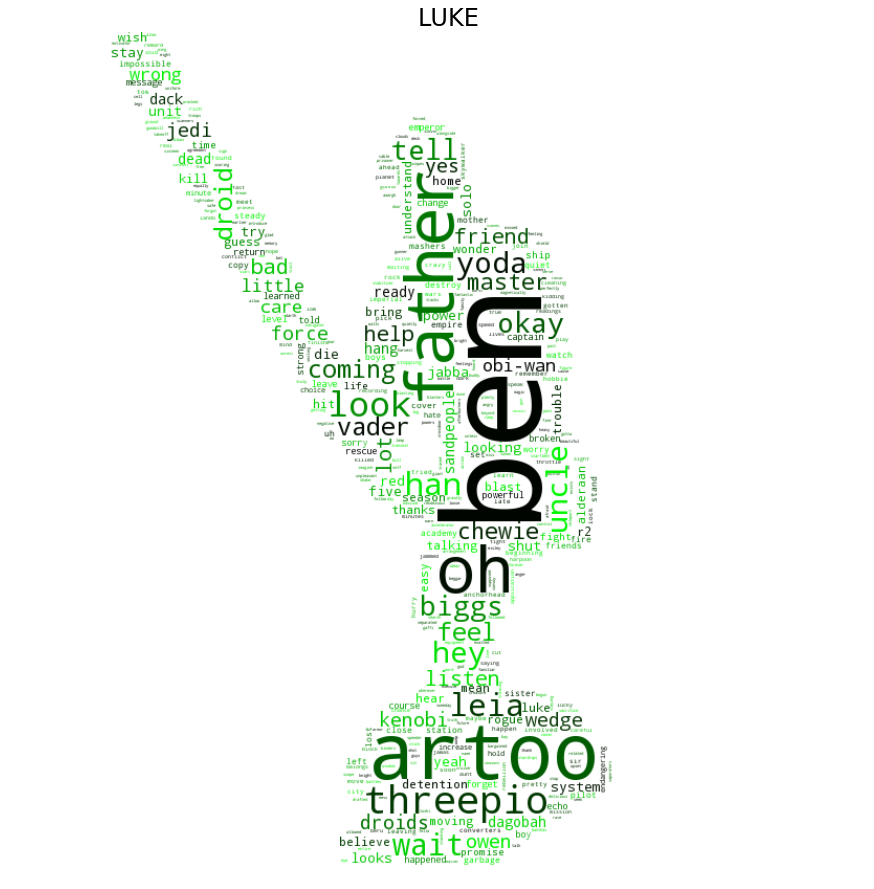

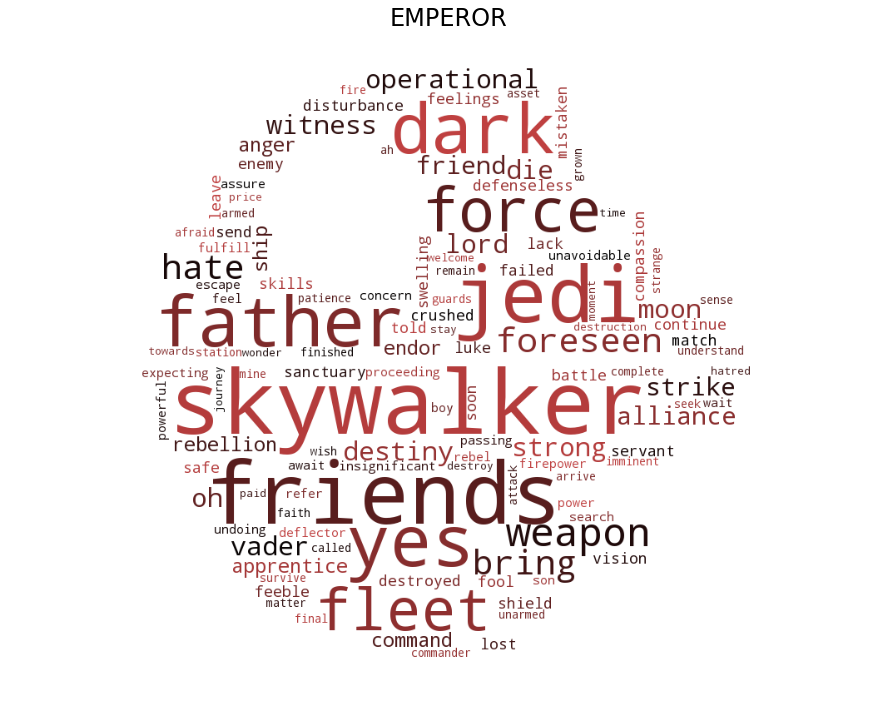

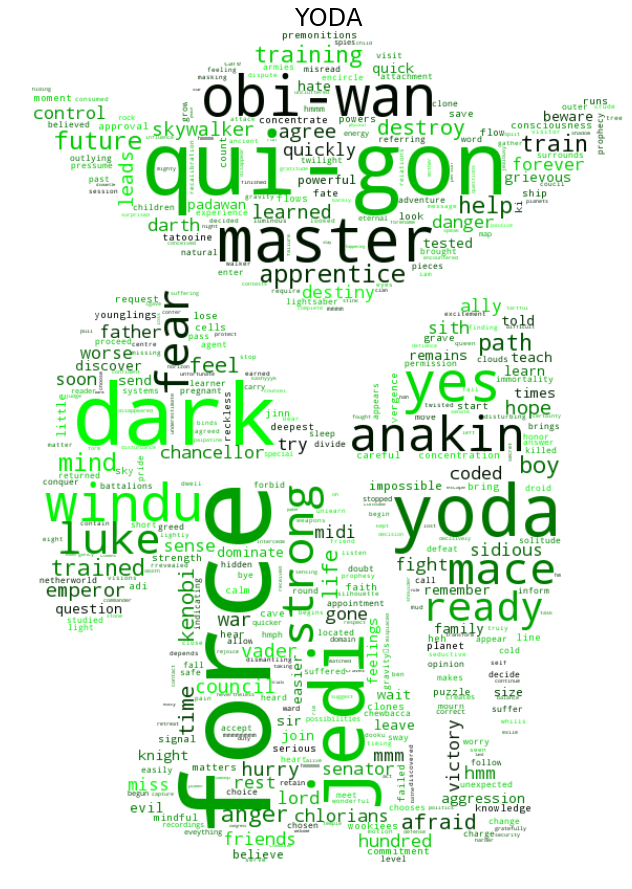

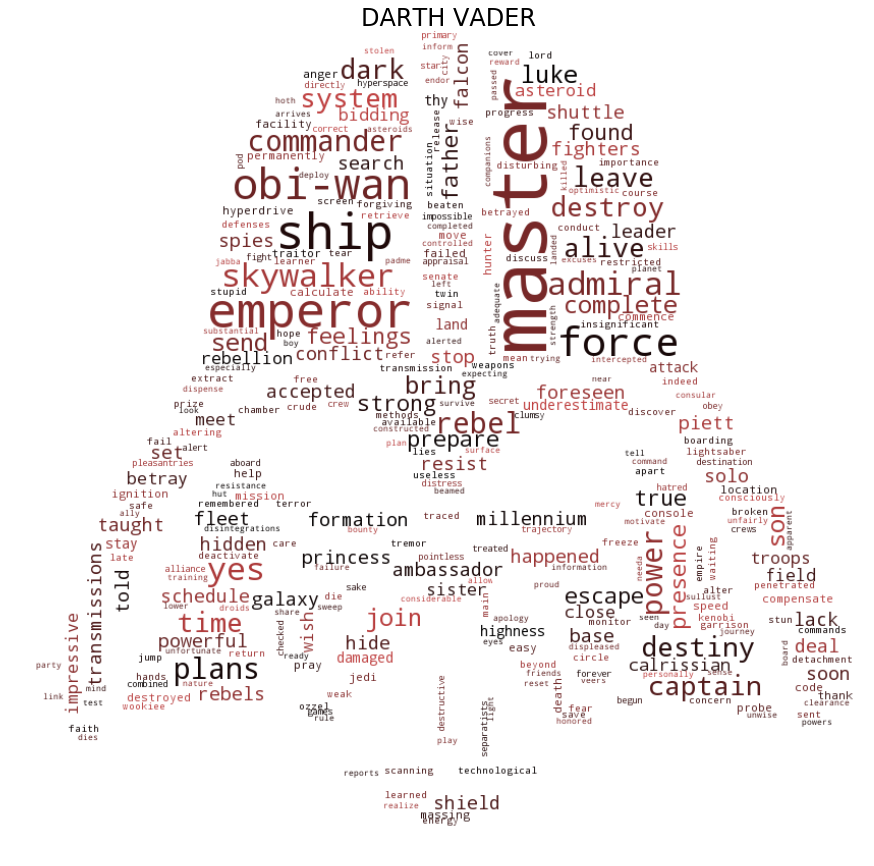

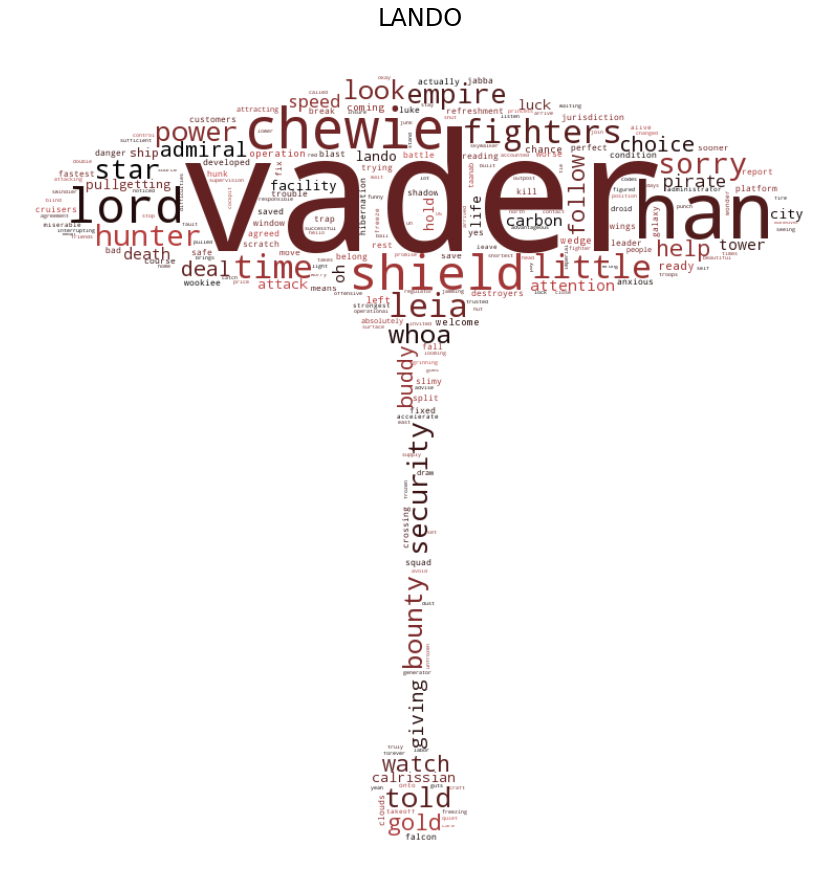

In [55]:
for name, fname in mask_names.iteritems():
    mask = imread('masks/' + fname)
    
    ratio = 800. / mask.shape[0]
    mask = resize(mask, (800, int(mask.shape[1] * ratio)), preserve_range=True)
    
    txt = cleaned[name]
    text = ' '.join(txt)
    
    if name in bright:
        bground = 'white'
        cfunc = green
    else:
        bground = 'white'
        cfunc = red

    frequencies = Counter(text.split(' ')) 
    wordcloud = WordCloud(relative_scaling=.5,
                          max_words=1000, mask=mask, background_color=bground,
                          color_func=cfunc).generate_from_frequencies(frequencies.items())
    pl.figure(figsize=(15, 15))
    pl.imshow(wordcloud, cmap=pl.cm.gray)
    pl.axis('off')
    pl.title(name, fontsize=24)
    pl.show()

### TF-IDF

In [56]:
import string
rm_punctuation_map = dict((ord(char), u' ') for char in string.punctuation)
repls = ('jar jar', 'jar-jar'), ('obi wan', 'obi-wan'), ('qui gon', 'qui-gon'), ('r2 d2', 'r2-d2'), \
    (u'padm\xe9', 'padme')
def string_cleaning(characters):
    cleaned = dict()
    for k, v in characters.iteritems():
        txt = v.translate(rm_punctuation_map).lower()
        txt = re.sub(r'\s+', ' ', txt)
        cleaned[k] = reduce(lambda a, kv: a.replace(*kv), repls, txt)
    return cleaned

In [57]:
cleaned = string_cleaning(characters)

In [58]:
from sklearn.feature_extraction.text import TfidfVectorizer

In [59]:
vectorizer = TfidfVectorizer()

In [60]:
bla = vectorizer.fit_transform(cleaned.values())

In [61]:
blub = bla.toarray()

In [62]:
len(blub)

17

In [63]:
blub[0]

array([ 0.,  0.,  0., ...,  0.,  0.,  0.])

In [64]:
len(vectorizer.get_feature_names())

4197

In [65]:
idx = np.argsort(blub[-1])[::-1]

In [66]:
np.array(vectorizer.get_feature_names())[idx[:20]]

array([u'you', u'the', u'to', u'we', u'all', u'of', u'that', u'what',
       u'vader', u'han', u'right', u'it', u'and', u'they', u'chewie',
       u'll', u're', u'get', u'this', u'for'], 
      dtype='<U16')